In [2]:
import os
if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")

In [3]:
import plotly.io as pio
import numpy as np
from datetime import datetime, timedelta

In [4]:
from element_array_ephys.ephys_no_curation import map_channel_to_electrode
from workflow.pipeline import frame, ephys, mua, probe, analysis

c:\Users\Organoid PC\anaconda3\envs\utah_organoids\lib\site-packages\datajoint\plugin.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
[2026-04-20 15:44:48,898][INFO]: DataJoint 0.14.8 connected to judewerth@db.datajoint.com:3306


Module stfio is not installed. Make sure .abf files are converted to .pkl in Python 2.


In [5]:
# needed information to insert trace plot
organoid_id = "O18"
start_time = datetime(2023, 7, 11, 7, 20)

mua.MUASpikes.Channel & f"organoid_id = '{organoid_id}'" & f"start_time BETWEEN'{start_time}' AND '{start_time+timedelta(minutes=1)}'"

organoid_id e.g. O17,experiment_start_time,start_time,threshold_uv uV threshold for spike detection,channel_idx channel index,channel_id channel id,spike_count number of spikes,spike_rate Hz,noise_level Median Absolute Deviation of the signal,spike_indices spike indices in samples,spike_amp spike amplitudes in uV
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,0,B-000,13,0.216667,10.1188,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,1,B-001,590,9.83333,8.96233,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,2,B-002,1,0.0166667,10.1188,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,3,B-003,17,0.283333,5.20393,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,4,B-004,0,0.0,4.0475,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,5,B-005,0,0.0,2.31286,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,6,B-006,0,0.0,2.31286,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,7,B-007,0,0.0,2.31286,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,8,B-008,0,0.0,2.31286,=BLOB=,=BLOB=
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,9,B-009,0,0.0,2.89107,=BLOB=,=BLOB=


In [6]:
# Select from the table above
channel_idx = 1

In [ ]:
# Or if you have an electrode index and want to find the corresponding channel index for the trace plot key
electrode_idx = None
if electrode_idx is not None:
    channel_idx = map_channel_to_electrode(input_indices=electrode_idx, electrode_to_channel=True)

In [7]:
# get key from MUASpikes.Channel
insert_key = (mua.MUASpikes.Channel & f"organoid_id = '{organoid_id}'" &
               f"start_time BETWEEN '{start_time}' AND '{start_time+timedelta(minutes=1)}'" &
                f"channel_idx = {channel_idx}").fetch1("KEY")
mua.MUASpikes.Channel & insert_key

organoid_id e.g. O17,experiment_start_time,start_time,threshold_uv uV threshold for spike detection,channel_idx channel index,channel_id channel id,spike_count number of spikes,spike_rate Hz,noise_level Median Absolute Deviation of the signal,spike_indices spike indices in samples,spike_amp spike amplitudes in uV
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,1,B-001,590,9.83333,8.96233,=BLOB=,=BLOB=


In [8]:
# insert key into MUATraceSession 
mua.TraceSession.insert1(insert_key, skip_duplicates=True)
mua.TraceSession & insert_key

organoid_id e.g. O17,experiment_start_time,start_time,threshold_uv uV threshold for spike detection,channel_idx channel index
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,1


In [9]:
# OPTIONAL: Manually populate TracePlot
mua.TracePlot.populate(insert_key)
mua.TracePlot & insert_key

organoid_id e.g. O17,experiment_start_time,start_time,threshold_uv uV threshold for spike detection,channel_idx channel index,electrode electrode idx when mapped (tip=0),trace_plot Plot of trace with spike peaks (as json)
O18,2023-06-22 15:40:00,2023-07-11 07:20:45,50.0,1,15,=BLOB=


In [10]:
# Wait for the populate to finish, then run the following cell to fetch and show the plot

trace_plot = (mua.TracePlot & insert_key).fetch1("trace_plot")

fig = pio.from_json(trace_plot)

# limit x-axis from 0 to 60 seconds
fig.update_xaxes(range=[0, 60])

fig.show()

In [24]:
from spikeinterface.extractors.extractor_classes import (
    recording_extractor_full_dict,
)
from scipy.signal import welch, spectrogram
from intanrhdreader import read_header
import spikeinterface as si

In [12]:
key = insert_key
key["file_time"] = insert_key["start_time"]

In [95]:
file, acq_software = (ephys.EphysRawFile & key).fetch1("file_path", "acq_software")
si_extractor = recording_extractor_full_dict[acq_software.replace(" ", "").lower()]

# Read data. Concatenate if multiple files are found.
file_path = mua.find_full_path(ephys.get_ephys_root_data_dir(), file)

# Get stream name for this file
streams = si_extractor.get_streams(file_path)[0]
amplifier_streams = [s for s in streams if "amplifier" in s]
if not amplifier_streams:
    raise ValueError(f"No amplifier stream found in file: {file_path}")
stream_name = amplifier_streams[0]

# Get recording object
si_recording = si_extractor(file_path, stream_name=stream_name)

# Figure out `Port ID` from the existing EphysSessionProbe
port_id = 'A'

# read intan header
with open(file_path, "rb") as f:
    header = read_header(f)
port_indices = np.array(
    [
        ind
        for ind, ch in enumerate(header["amplifier_channels"])
        if ch["port_prefix"] == port_id
    ]
)  # get the row indices of the port

si_recording = si_recording.select_channels(
    si_recording.channel_ids[port_indices]
)  # select only the port data

# Check if recording is unsigned and convert if necessary
# Please check the SI documentation for more details: https://spikeinterface.readthedocs.io/en/latest/how_to/unsigned_to_signed.html
if str(si_recording.get_dtype()).startswith("u"):
    si_recording = si.preprocessing.unsigned_to_signed(si_recording)

si_recording = si.preprocessing.common_reference(
    recording=si_recording, operator="median"
)

fs = si_recording.get_sampling_frequency()
channel_ids = si_recording.channel_ids

traces = si_recording.get_traces()

# Simple PSD via Welch
dt = int(3 * fs)  # 3-second windows with 50% overlap
frequencies, psd = welch(traces, fs=fs, nperseg=dt, noverlap=dt//2, axis=0)  # PSD in power/Hz
time = si_recording.get_times()  # Get time vector for the recording

[2026-04-08 15:36:39,582][WARNING]: Reconnecting to MySQL server.


In [40]:
trace = si_recording.get_traces(channel_ids=[si_recording.get_channel_ids()[channel_idx]]).squeeze()  # Get trace for the selected channel index
time = si_recording.get_times()  # Get time vector for the recording

In [16]:
from matplotlib import pyplot as plt

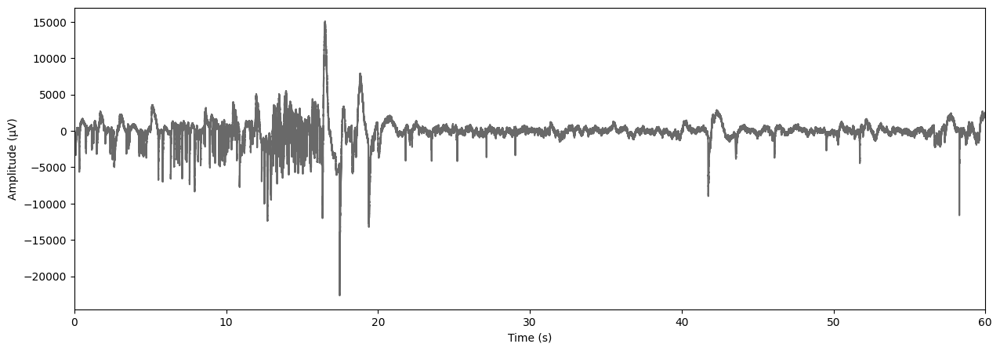

In [144]:

fig, ax = plt.subplots(figsize=(15, 5))

ax.plot(time, trace, color="dimgray")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude (μV)")
ax.set_xlim(0, 60)  # limit x-axis from 0 to 60 seconds

plt.show()


In [58]:
freq_range = (1, 300)  # Frequency range of interest
# get frequency band information
# get frequency bands
frequency_bands = {
    band['band_name']: (band['lower_freq'], band['upper_freq']) for band in analysis.SpectralBand.fetch(as_dict=True, order_by='lower_freq')
    }

band_colors = {
    "delta": "#ad2bea",
    "theta": "#4d3ff8",
    "alpha": "#39cabb",
    "beta": "#53e53a",
    "gamma": "#e3e12c",
    "highgamma1": "#f7a740",
    "highgamma2": "#ed3838",
}

greek_letters = {
    "delta": "\u03B4",
    "theta": "\u03B8",
    "alpha": "\u03B1",
    "beta": "\u03B2",
    "gamma": "\u03B3",
    "highgamma1": "\u03B3\u2081", 
    "highgamma2": "\u03B3\u2082",  
}

[2026-04-08 15:12:14,517][WARNING]: Reconnecting to MySQL server.


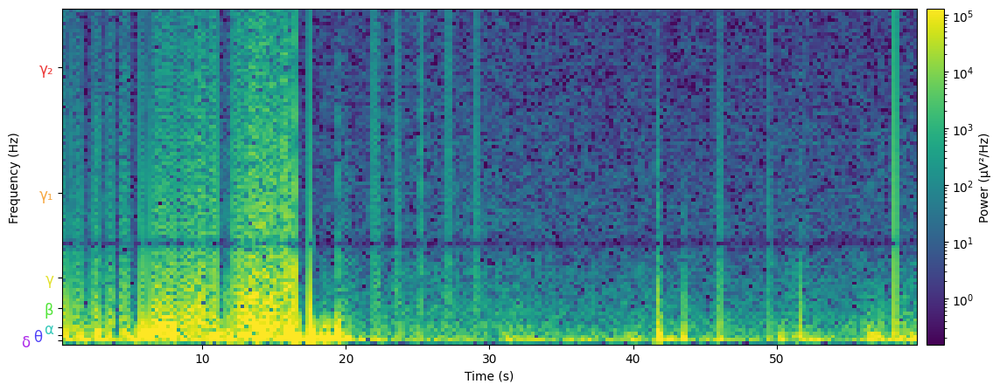

In [141]:
from matplotlib.colors import LogNorm

dt = int(.5 * fs)

# get spectrogram
freqs, times, psd_t = spectrogram(
    trace,
    fs=fs,
    nperseg=dt,
    noverlap=dt // 2,
    mode='psd',
    scaling='density',
)

# cap frequency values
freq_max = 200
freq_mask = freqs <= freq_max
freqs = freqs[freq_mask]
psd_t = psd_t[freq_mask, :]

# plot spectrogram (log scale)
fig, ax = plt.subplots(figsize=(15, 5))

vmin = np.percentile(psd_t, 1)
vmax = np.percentile(psd_t, 99)

im = ax.imshow(
    psd_t,
    aspect='auto',
    origin='lower',
    extent=[times.min(), times.max(), freqs.min(), freqs.max()],
    norm=LogNorm(vmin=vmin, vmax=vmax),
    cmap='viridis',
)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Frequency (Hz)', labelpad=0)
fig.colorbar(im, ax=ax, label='Power (μV²/Hz)', pad=0.01)

# show frequency band means on y-ticks
yticks = [np.mean([f_lower, f_upper]) for f_lower, f_upper in frequency_bands.values()]
ytick_labels = [greek_letters[band] for band in frequency_bands.keys()]
ytick_colors = [band_colors[band] for band in frequency_bands.keys()]

ax.set_yticks(yticks)
ax.set_yticklabels(ytick_labels, fontsize=12)

# make custom x offsets for some y ticks to avoid them overlapping (delta, theta, alpha)
ytick_offsets = {
    "delta": -0.028,
    "theta": -0.014,
}

for i, lbl in enumerate(ax.get_yticklabels()):
    band_name = list(frequency_bands.keys())[i]

    if band_name in list(ytick_offsets.keys()):
        
        lbl.set_x(ytick_offsets[band_name])

    # Alternate horizontal offsets so close bands do not overlap visually
    # lbl.set_x(-0.03 if i % 2 == 0 else -0.08)
    lbl.set_color(ytick_colors[i])




plt.show()

In [43]:
psd_t.shape

(30001, 39)

(1.0, 300.0)

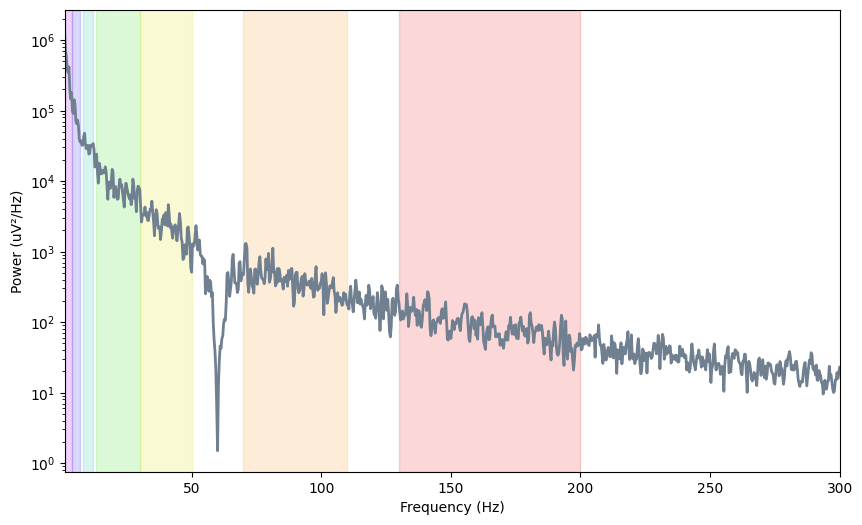

In [23]:
fig, ax = plt.subplots(figsize=(10, 6))

frequency_mask = (freqs >= freq_range[0]) & (freqs <= freq_range[1])
ax.plot(freqs[frequency_mask], psd[frequency_mask, channel_idx], color="slategray", linewidth=2)

for band_name, (low_freq, high_freq) in frequency_bands.items():
    ax.axvspan(low_freq, high_freq, color=band_colors[band_name], alpha=0.2)

ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Power (uV\u00b2/Hz)")
ax.set_yscale("log")
ax.set_xlim(freq_range)

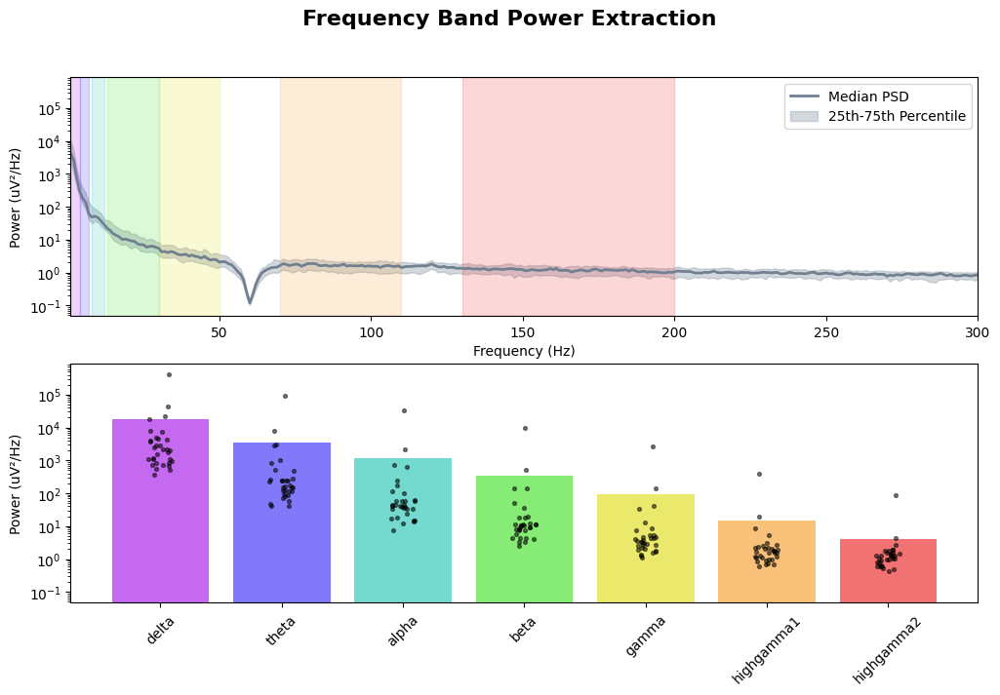

In [20]:
# Plot 2x1 figure
# top subplot: PSD with frequency bands shaded (line=median, shaded area=25th-75th percentile across channels)
# bottom subplot: bar plots with frequency band power

fig, axs = plt.subplots(2, 1, figsize=(12, 7), sharey=True)
fig.suptitle("Frequency Band Power Extraction", fontsize=16, fontweight="bold")

# top subplot: PSD with frequency bands shaded (line=median, shaded area=25th-75th percentile across channels)
frequency_mask = (freqs >= freq_range[0]) & (freqs <= freq_range[1])
lfp_psd = psd[frequency_mask, :]
median_psd = np.median(lfp_psd, axis=1)
percentile_25 = np.percentile(lfp_psd, 25, axis=1)
percentile_75 = np.percentile(lfp_psd, 75, axis=1)

axs[0].plot(freqs[frequency_mask], median_psd, color="slategray", linewidth=2, label="Median PSD")
axs[0].fill_between(freqs[frequency_mask], percentile_25, percentile_75, color="slategray", alpha=0.3, label="25th-75th Percentile")
for band_name, (low_freq, high_freq) in frequency_bands.items():
    axs[0].axvspan(low_freq, high_freq, color=band_colors[band_name], alpha=0.2)

axs[0].set_xlabel("Frequency (Hz)")
axs[0].set_ylabel("Power (uV\u00b2/Hz)")
axs[0].set_xlim(freq_range)
axs[0].set_yscale("log")
axs[0].legend()

# bottom subplot: bar plots with frequency band power
for i, (band_name, (low_freq, high_freq)) in enumerate(frequency_bands.items()):
    band_mask = (freqs >= low_freq) & (freqs <= high_freq)
    band_power = np.mean(psd[band_mask, :], axis=0)  # Average power across frequencies in the band
    axs[1].bar(i, np.mean(band_power), color=band_colors[band_name], alpha=0.7)
    axs[1].scatter(i+np.random.uniform(-0.1, 0.1, size=band_power.shape), band_power, color="black", alpha=0.5, s=30, marker=".")  # Add scatter of individual channel powers

axs[1].set_ylabel("Power (uV\u00b2/Hz)")
axs[1].set_yscale("log")
axs[1].set_xticks(range(len(frequency_bands)))
axs[1].set_xticklabels(frequency_bands.keys(), rotation=45)

plt.show()


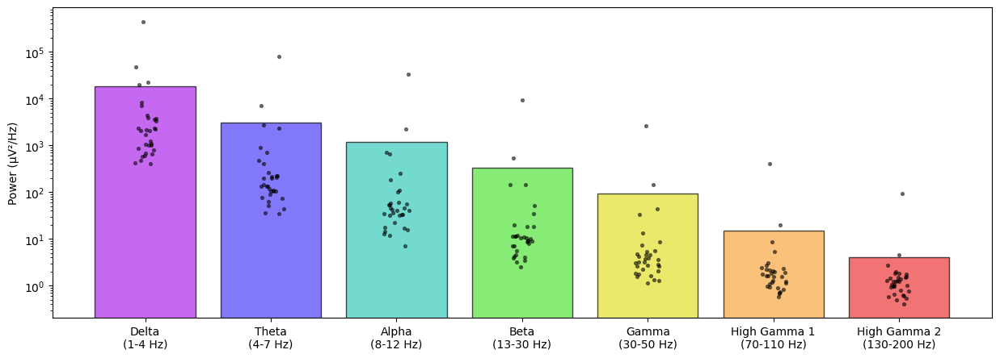

In [ ]:
# Plot frequency band powers
xticklabels = ["Delta\n(1-4 Hz)", "Theta\n(4-7 Hz)", "Alpha\n(8-12 Hz)", "Beta\n(13-30 Hz)", "Gamma\n(30-50 Hz)", "High Gamma 1\n(70-110 Hz)", "High Gamma 2\n(130-200 Hz)"]

fig, ax = plt.subplots(figsize=(15, 5))
for i, (band_name, (low_freq, high_freq)) in enumerate(frequency_bands.items()):
    band_mask = (frequencies >= low_freq) & (frequencies <= high_freq)
    band_power = np.mean(psd[band_mask, :], axis=0)  # Average power across frequencies in the band
    ax.bar(i, np.mean(band_power), color=band_colors[band_name], alpha=0.7, edgecolor="black")
    ax.scatter(i+np.random.uniform(-0.1, 0.1, size=band_power.shape), band_power, color="black", alpha=0.5, s=30, marker=".")  # Add scatter of individual channel powers

ax.set_ylabel("Power (μV²/Hz)")
ax.set_yscale("log")
ax.set_xticks(range(len(frequency_bands)))
ax.set_xticklabels(xticklabels)

plt.show()

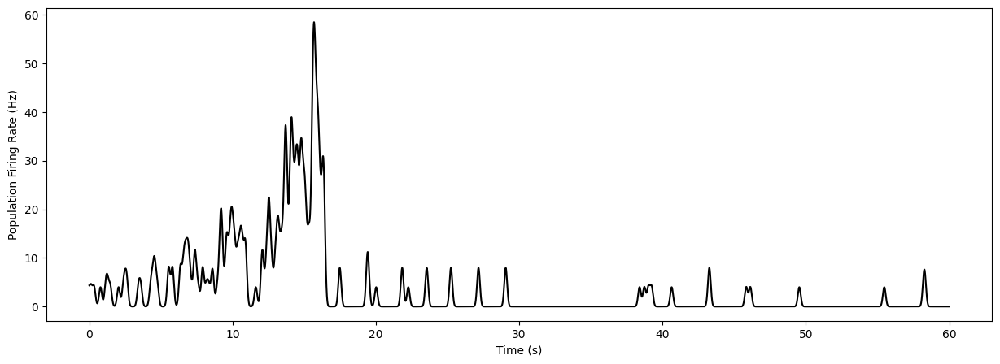

In [139]:
import bottleneck as bn
from scipy.ndimage import gaussian_filter1d

# Plot population firing rate for the same session (minute)

# get mua spikes
time_key = insert_key.copy()
time_key.pop("channel_idx", None)

spike_times = np.concatenate((mua.MUASpikes.Channel & time_key).fetch("spike_indices")) / fs # convert to seconds

# get population firing rate (1 ms bins)
time_bins = np.arange(0, 60, 0.001)  # 1 ms bins
population_firing_rate, _ = np.histogram(spike_times, bins=time_bins)  
population_firing_rate *= 1000 # convert to firing rate in Hz

# filter population firing rate
gaus_len_ms, boxcar_len_ms = mua.BurstDetectionParamset.fetch1("gaus_len_ms", "boxcar_len_ms")
population_firing_rate = bn.move_mean(population_firing_rate, window=boxcar_len_ms, min_count=1)

truncate = 4
population_firing_rate = gaussian_filter1d(population_firing_rate, sigma=gaus_len_ms, truncate=truncate, mode="reflect")

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(time_bins[:-1], population_firing_rate, color="black")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Population Firing Rate (Hz)")
plt.show()  


In [135]:
mua.BurstDetectionParamset()

burst_param_idx Unique identifier for the burst detection parameter set,gaus_len_ms Gaussian kernel length in milliseconds,boxcar_len_ms Boxcar kernel length in milliseconds,detection_threshold Threshold for burst detection in standard deviations,min_distance_ms Minimum distance between bursts in milliseconds
1,100,20,2.0,1000.0


In [124]:
time_key = insert_key.copy()

# remove channel idx from key (without removing it from the original insert_key)
time_key.pop("channel_idx", None)
time_key

{'organoid_id': 'O09',
 'experiment_start_time': datetime.datetime(2023, 5, 3, 17, 33),
 'start_time': datetime.datetime(2023, 5, 3, 19, 41, 49),
 'threshold_uv': Decimal('50.0')}

In [134]:
spike_times

array([  101.45,   322.6 ,   770.3 ,  1144.35,  1268.2 ,  1458.5 ,
        2032.85,  2371.75,  2511.95,  2615.5 ,  3425.7 ,  3581.4 ,
        4277.9 ,  4416.95,  4535.85,  4566.45,  4741.35,  5528.15,
        5530.25,  5794.65,  5796.7 ,  6345.  ,  6347.  ,  6569.2 ,
        6573.05,  6719.7 ,  6721.7 ,  6833.9 ,  6918.8 ,  6920.95,
        7091.4 ,  7334.15,  7336.15,  7407.15,  7586.6 ,  7900.  ,
        7902.1 ,  8153.2 ,  8321.7 ,  8556.1 ,  8612.05,  8928.45,
        9121.15,  9123.4 ,  9177.6 ,  9180.1 ,  9269.2 ,  9271.3 ,
        9535.6 ,  9537.6 ,  9585.65,  9665.45,  9754.05,  9828.45,
        9893.1 ,  9895.3 ,  9937.4 ,  9996.65, 10086.1 , 10088.25,
       10178.9 , 10299.65, 10357.95, 10418.1 , 10541.85, 10544.3 ,
       10588.45, 10704.3 , 10706.55, 10887.  , 10889.15, 10891.35,
       11608.95, 12043.8 , 12046.15, 12104.35, 12340.65, 12342.7 ,
       12512.05, 12514.3 , 12516.35, 12555.45, 12713.6 , 12715.7 ,
       12957.55, 12959.7 , 13107.3 , 13109.8 , 13170.85, 13173